# Project 4 - Part 1 Regression Analysis

Gorkem Camli (105709280)

#### Library imports

In [1]:
import pandas as pd
import numpy as np
import random
from pandas_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler,OrdinalEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LassoLarsIC
from sklearn.preprocessing import PolynomialFeatures


from sklearn.model_selection import GridSearchCV

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import time

import warnings
warnings.filterwarnings('ignore')

In [85]:
 %matplotlib inline 
sns.set_style("whitegrid")

In [53]:
rand_seed = 142
np.random.seed(rand_seed)
random.seed(rand_seed)

#### Dataset Exploration

Diamonds Data

In [4]:
diamonds_df = pd.read_csv('diamonds.csv', index_col=0)
print(diamonds_df.shape)
diamonds_df.head()

(53940, 10)


,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,330,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,327,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,328,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,337,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,338,4.34,4.35,2.75


In [5]:
diamonds_df.dtypes

carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
dtype: object

Gas Turbine CO and NOx Emission Data

In [6]:
repo_name = 'pp_gas_emission/'
file_names= ['gt_2011.csv',
             'gt_2012.csv',
             'gt_2013.csv',
             'gt_2014.csv',
             'gt_2015.csv'
]

gas_partial_dfs = []
for file_name in file_names:
    year = file_name[file_name.find('_')+1: file_name.find('.')]
    year_df = pd.read_csv(repo_name+file_name)
    year_df['year']= year
    gas_partial_dfs.append(year_df)


gas_df = pd.concat(gas_partial_dfs)
print(gas_df.shape)
gas_df.head()

(36733, 12)


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX,year
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952,2011
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377,2011
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776,2011
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505,2011
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028,2011


In [7]:
gas_df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,11.678357
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,57.162000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,63.849000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,71.548000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000


In [8]:
gas_df.describe(include=['category','object'])

,year
count,36733
unique,5
top,2012
freq,7628


In [9]:
gas_df = gas_df.drop(columns=['CO'])
gas_df.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,NOX,year
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,81.952,2011
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,82.377,2011
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,83.776,2011
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,82.505,2011
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,82.028,2011


## Before Training

### Standardization

#### Question 1

For diamonds data, all the categorical features are quality features, therefore I used Ordinal Encoder to encode them. While encoding the given labels are ordered based on the features quality. For examples for cut categories: Fair gets the lowest label number whereas Ideal got the highest. For numerical categories, standard scaler is applied.

In [10]:
# get feature names by type
diamonds_num_cols =  diamonds_df.select_dtypes(include=['int64', 'float64']).drop(['price'], axis=1).columns
diamonds_cat_cols = diamonds_df.select_dtypes(include=['object', 'category']).columns

print(diamonds_num_cols)
print(diamonds_cat_cols)

Index(['carat', 'depth', 'table', 'x', 'y', 'z'], dtype='object')
Index(['cut', 'color', 'clarity'], dtype='object')


In [11]:
# create a feature transformer for each type of features
cut_categories = ['Fair', 'Good','Very Good', 'Premium','Ideal']
color_categories = ['J', 'I', 'H', 'G', 'F', 'E', 'D']
clarity_categories = ['I1','SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF']
diamonds_categs_order = [cut_categories, color_categories, clarity_categories]
    
def feature_transformer_diamonds(data, numeric_feats, categ_feats, diamonds_categs_order, scale=True):
    cat_transformer_ordinal = Pipeline(steps=[('ordinal_enc', OrdinalEncoder(categories=diamonds_categs_order))])
    data[categ_feats] = cat_transformer_ordinal.fit_transform(data[categ_feats])
    if scale:
        num_transformer = Pipeline(steps=[('std_scaler', StandardScaler())])
        # TODO check data[numeric_feats+categ_feats] which one makes sense
        # data[list(numeric_feats)+list(categ_feats)] = num_transformer.fit_transform(data[list(numeric_feats)+list(categ_feats)]) # TODO check data[numeric_feats+categ_feats] 
        data[numeric_feats] = num_transformer.fit_transform(data[numeric_feats]) 
        
    #preprocessor = ColumnTransformer(transformers= [('num_transformer', num_transformer, numeric_feats),
    #                                               ('cat_transformer', cat_transformer_ordinal, categ_feats)])
    
    return data


In [12]:
print("Raw Diamonds Data")
display(diamonds_df.head(4))
diamonds_prep_df= diamonds_df.copy()
diamonds_prep_df = feature_transformer_diamonds(data=diamonds_prep_df, 
                                                numeric_feats=diamonds_num_cols, 
                                                categ_feats=diamonds_cat_cols,
                                                diamonds_categs_order=diamonds_categs_order,
                                                scale=True)
print("Diamonds Data After Standardization and Category Feature Encoding")
diamonds_prep_df.head(4)

Raw Diamonds Data


,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,330,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,327,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,328,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,337,4.20,4.23,2.63


Diamonds Data After Standardization and Category Feature Encoding


,carat,cut,color,clarity,depth,table,price,x,y,z
1,-1.198168,0.981473,0.937163,-1.245215,-0.174092,-1.099672,330,-1.587837,-1.536196,-1.571129
2,-1.240361,0.085889,0.937163,-0.638095,-1.360738,1.585529,327,-1.641325,-1.658774,-1.741175
3,-1.198168,-1.705279,0.937163,0.576145,-3.385019,3.375663,328,-1.498691,-1.457395,-1.741175
4,-1.071587,0.085889,-1.414272,-0.030975,0.454133,0.242928,337,-1.364971,-1.317305,-1.287720


In [75]:
print('Description of Diamonds data after standardization')
diamonds_prep_df.describe()

Description of Diamonds data after standardization


,carat,cut,color,clarity,depth,table,price,x,y,z
count,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,53940.000000,5.394000e+04,5.394000e+04,5.394000e+04
mean,2.444878e-16,1.454281e-16,1.338360e-16,-8.114467e-17,-3.996902e-15,9.695207e-17,3934.801557,2.782103e-16,-8.430615e-17,-2.002271e-16
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,3989.442321,1.000009e+00,1.000009e+00,1.000009e+00
min,-1.261458e+00,-2.600864e+00,-2.002131e+00,-1.852335e+00,-1.308760e+01,-6.470073e+00,327.000000,-5.109120e+00,-5.020931e+00,-5.014556e+00
25%,-8.395232e-01,-8.096951e-01,-8.264134e-01,-6.380951e-01,-5.231053e-01,-6.521385e-01,952.000000,-9.103248e-01,-8.882800e-01,-8.909461e-01
50%,-2.066210e-01,8.588908e-02,-2.385547e-01,-3.097505e-02,3.531678e-02,-2.046051e-01,2403.000000,-2.777553e-02,-2.147398e-02,-1.237618e-02
75%,5.106683e-01,9.814733e-01,9.371628e-01,5.761450e-01,5.239361e-01,6.904618e-01,5327.250000,7.210542e-01,7.052421e-01,7.103184e-01
max,8.886075e+00,9.814733e-01,1.525021e+00,2.397505e+00,1.204139e+01,1.680167e+01,18823.000000,4.465203e+00,4.654965e+01,4.004758e+01


In [13]:
diamonds_unscaled_df = diamonds_df.copy()
diamonds_unscaled_df = feature_transformer_diamonds(data=diamonds_unscaled_df, 
                                                numeric_feats=diamonds_num_cols, 
                                                categ_feats=diamonds_cat_cols,
                                                diamonds_categs_order=diamonds_categs_order,
                                                scale=False)
#diamonds_unscaled_df.describe()

### Profiling Results

Pandas profiling is used to explore the dataset for both diamonds and gas dataset. The results can be seen below:

In [15]:
#profile_diamonds = ProfileReport(diamonds_df)
#profile_diamonds

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
#profile_gas = ProfileReport(gas_df)
#profile_gas

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Inspection

To further understand the data I did fata inspection and answered the following questions:

#### Question 2

For both datasets heatmap with pearson correlation is plotted:

In [17]:
def heat_map(data_df, data_name=''):
    plt.figure(figsize=(10,10))
    corr = data_df.corr(method='pearson')
    sns.heatmap(corr, annot=True, linewidths=1)
    plt.title(data_name+' Heatmap ')
    plt.show()

__Diamonds Data:__

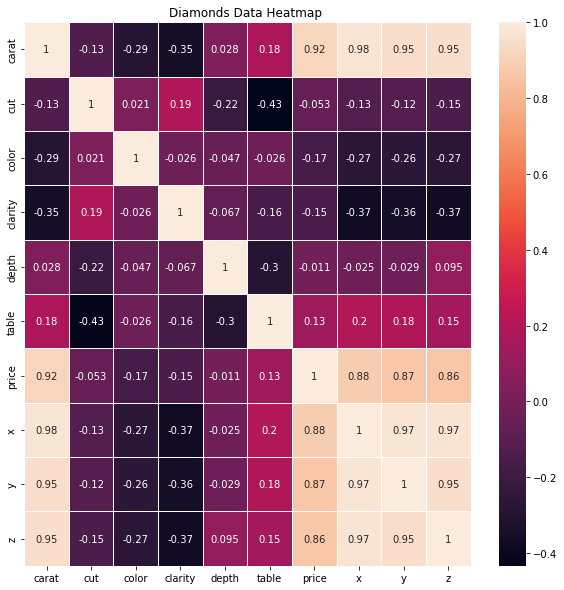

In [18]:
heat_map(data_df=diamonds_prep_df, data_name='Diamonds Data')

In the diamonds data Pearson Correlation heatmap, we see high correlation on carat,x, y, z and price columns. The pearson correlation values between price and carat is 0.92, x=0.88, y=0.87 and z=0.86. Carat seems to be the most important feature to tell the diamond price. The high correlation suggest carat, x, y, z values are the most predictive features for predicting the price of a diamond. The pearson correlation for these features are positive for target variable price. This means there is a positive relationship between these variables and price, hence the increasing any of these 4 features will lead the diamond price to be higher. These makes sense in the real world as well since the bigger diamonds (dimensions x,y,z) and/or carat (weight) are generally more expensive.

TODO explain

#### Question 3

Histogram of the numerical features for each dataset can be seen below:

In [94]:
def histogram_num_features(data, num_feats, data_name, num_rows, num_cols, fig_size):
    fig, ax = plt.subplots(num_rows, num_cols, figsize=fig_size)
    plt.suptitle(f'{data_name} Numerical Features Histogram')
    for num_feat, ax_ind in zip(num_feats, ax.ravel()):
        sns.histplot(data, x=num_feat, ax=ax_ind)
        ax_ind.set_title(f'{num_feat} Histogram')
    plt.show()


__Diamond Dataset:__

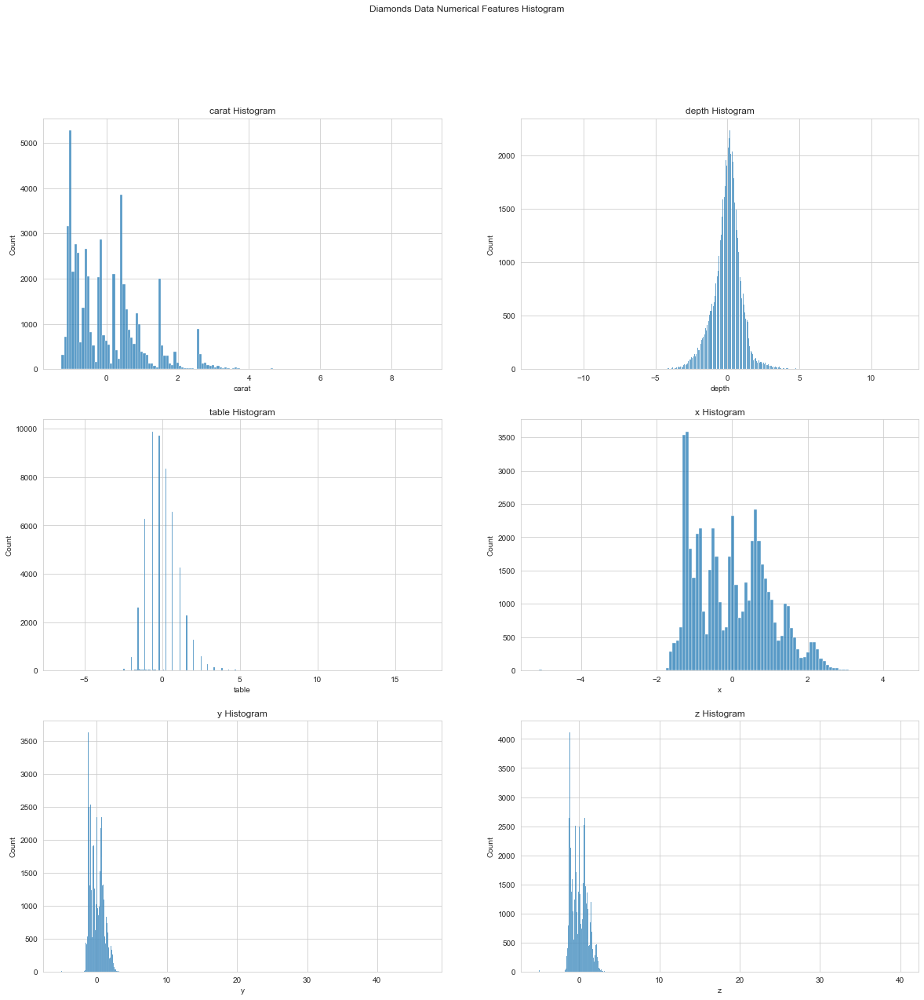

In [95]:
histogram_num_features(data=diamonds_prep_df,num_feats=diamonds_num_cols, data_name='Diamonds Data', 
                       num_rows=3, num_cols=2, fig_size=(20,20))

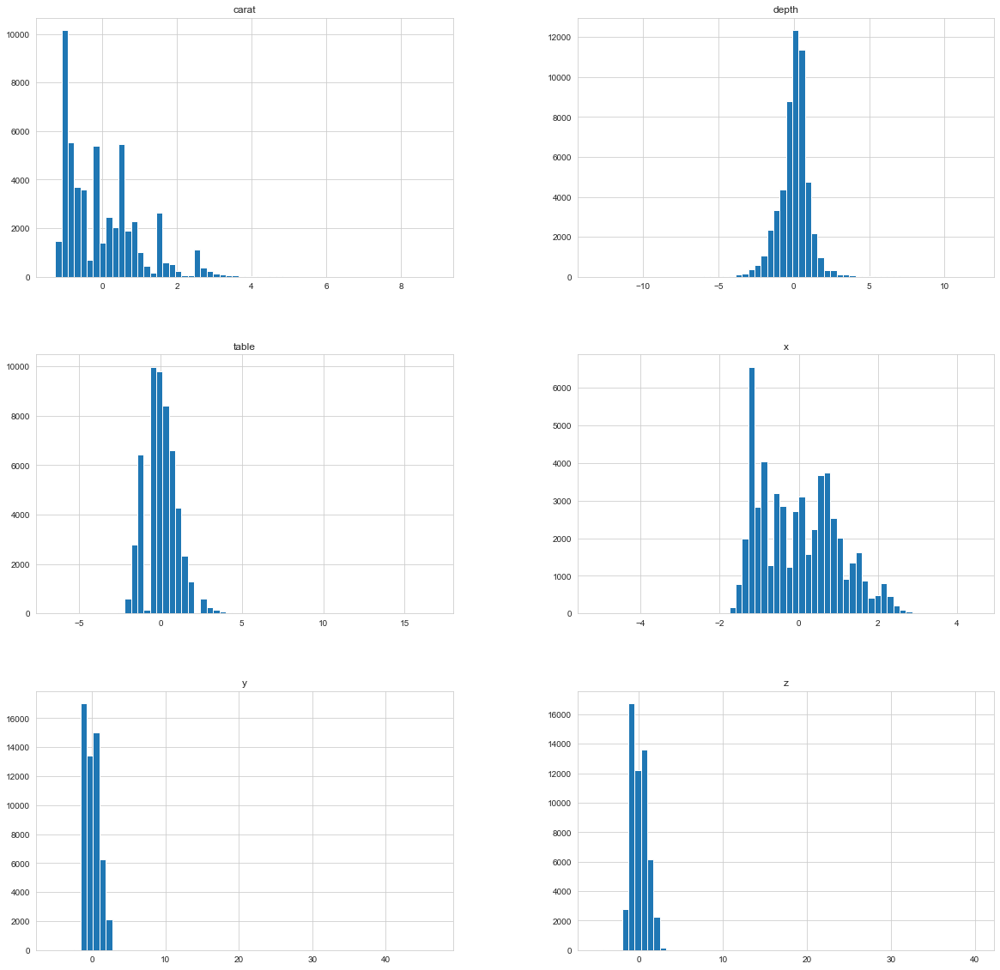

In [98]:
diamonds_prep_df[diamonds_num_cols].hist(figsize=(20, 20), bins=60)
plt.show()

In [96]:
diamonds_prep_df.describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,5.394000e+04,53940.000000,5.394000e+04,5.394000e+04,5.394000e+04
mean,2.444878e-16,1.454281e-16,1.338360e-16,-8.114467e-17,-3.996902e-15,9.695207e-17,3934.801557,2.782103e-16,-8.430615e-17,-2.002271e-16
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,3989.442321,1.000009e+00,1.000009e+00,1.000009e+00
min,-1.261458e+00,-2.600864e+00,-2.002131e+00,-1.852335e+00,-1.308760e+01,-6.470073e+00,327.000000,-5.109120e+00,-5.020931e+00,-5.014556e+00
25%,-8.395232e-01,-8.096951e-01,-8.264134e-01,-6.380951e-01,-5.231053e-01,-6.521385e-01,952.000000,-9.103248e-01,-8.882800e-01,-8.909461e-01
50%,-2.066210e-01,8.588908e-02,-2.385547e-01,-3.097505e-02,3.531678e-02,-2.046051e-01,2403.000000,-2.777553e-02,-2.147398e-02,-1.237618e-02
75%,5.106683e-01,9.814733e-01,9.371628e-01,5.761450e-01,5.239361e-01,6.904618e-01,5327.250000,7.210542e-01,7.052421e-01,7.103184e-01
max,8.886075e+00,9.814733e-01,1.525021e+00,2.397505e+00,1.204139e+01,1.680167e+01,18823.000000,4.465203e+00,4.654965e+01,4.004758e+01


TODO answer q

Carat and x features' histogram seems to be right skewed. Y and z plots have few outliers around 40 and they don't seem to follow gaussian distribution. Depth and table seems to be close to normal distribution.
 

__What preprocessing can be done if the distribution of a feature has high skewness?__

There are different ways to handle high skewed data and reduce its skewness:

1- Log Transform (natural log)   
2- Square root transform    
2- Box-Cox transformation   

There are different transformation possibilities to address the skewness of the data, and it is difficult to determine which one needs to be applied. Box-Cox transformation is a family of transformations where you select $\lambda$ value typically from -5 to 5. Optimal $\lambda$ is chosen based on the data where its transformation is the best approximation of a normally distributed curve. The transformation of data y is simply $y_\text{transformed} = y^\lambda$ 

 $\lambda=0$ corresponds to the natural log of the data.    
 $\lambda=0.5$ corresponds to the square root transform of the data.

#### Question 4

Box plot of categorical features in each dataset against target variable.

In [110]:
def boxplot_cat_features(data, cat_feats, target_feature, data_name, num_rows, num_cols, fig_size):
    fig, ax = plt.subplots(num_rows, num_cols, figsize=fig_size)
    plt.suptitle(f'{data_name} Categorical Features Boxplot against target variable ({target_feature})')
    for cat_feat, ax_ind, cat_order in zip(cat_feats, ax.ravel(), diamonds_categs_order):
        sns.boxplot(data=data, x=cat_feat, y=target_feature,  ax=ax_ind, order=cat_order)
    plt.show()

__Diamonds Data:__

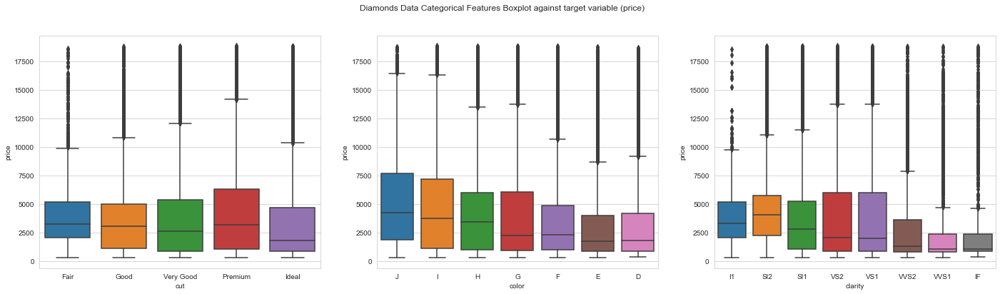

In [112]:
boxplot_cat_features(data=diamonds_df, cat_feats=diamonds_cat_cols, 
                     target_feature='price', data_name='Diamonds Data',
                     num_rows=1, num_cols=3, fig_size=(24,6))

TODO answer q

For cut boxplots, The mean 

In [ ]:
diamonds_categs_order

#### Question 5

In [24]:
def countplot_cat_features(data, num_feats, data_name,diamonds_categs_order, num_rows, num_cols, fig_size):
    fig, ax = plt.subplots(num_rows, num_cols, figsize=fig_size)
    plt.suptitle(f'{data_name} Count plots')
    for num_feat, cat_order, ax_ind in zip(num_feats, diamonds_categs_order, ax.ravel()):
        sns.countplot(data=data, x=num_feat,  ax=ax_ind, order=cat_order)
    plt.show()

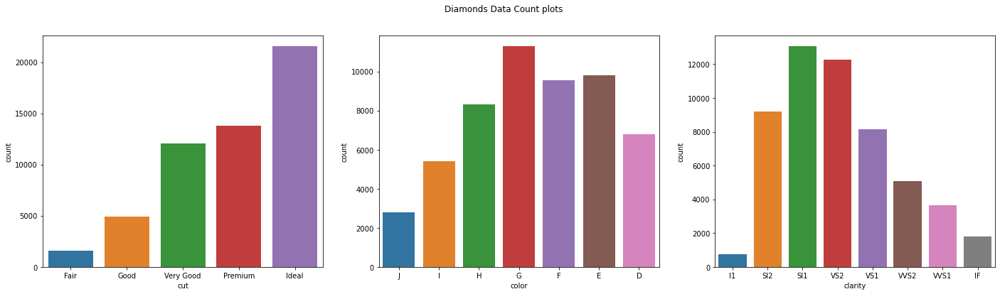

In [25]:
countplot_cat_features(data=diamonds_df, num_feats=diamonds_cat_cols, 
                     data_name='Diamonds Data', diamonds_categs_order=diamonds_categs_order,
                     num_rows=1, num_cols=3, fig_size=(24,6))

TODO comment

#### Question 6

#### Feature Selection

##### __Question 7__

In [26]:
diamond_features = list(diamonds_num_cols)+list(diamonds_cat_cols)
print(diamond_features)
X_diamonds = diamonds_prep_df[diamond_features]
X_diamonds_unscaled = diamonds_unscaled_df[diamond_features]
y_diamonds = diamonds_prep_df['price']

['carat', 'depth', 'table', 'x', 'y', 'z', 'cut', 'color', 'clarity']


__Mutual Info Regression__

In [27]:
mi = mutual_info_regression(X_diamonds, y_diamonds)
#mi /= np.max(mi)
mi

array([1.65030231, 0.03193093, 0.03366449, 1.41218748, 1.42094116,
       1.3610038 , 0.05731348, 0.13728887, 0.21571719])

__F Regression__

In [28]:
f_test, _ = f_regression(X_diamonds, y_diamonds)
#f_test /= np.max(f_test)
f_test

array([3.04051487e+05, 6.11586346e+00, 8.86119363e+02, 1.93741523e+05,
       1.60915662e+05, 1.54923267e+05, 1.54784468e+02, 1.65440124e+03,
       1.18800706e+03])

__Scatter Plot of features vs target variable along with Mutual Info and F Regression Scores__

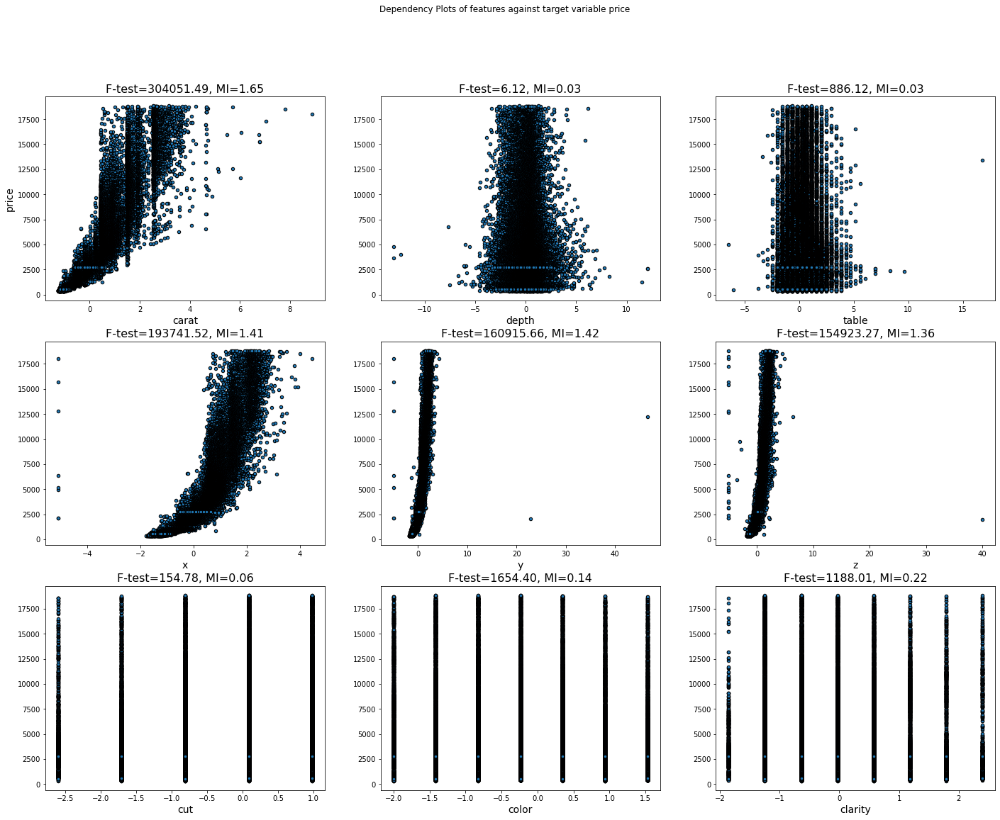

In [29]:
target_name ='price'
plt.figure(figsize=(24, 18))
plt.suptitle(f'Dependency Plots of features against target variable {target_name}')
for i, feat in enumerate(diamond_features):
    plt.subplot(3, 3, i + 1)
    plt.scatter(X_diamonds[feat], y_diamonds, edgecolor="black", s=20)
    plt.xlabel(feat, fontsize=14)
    if i == 0:
        plt.ylabel(target_name, fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

TODO answer question

In [30]:
most_important_feats_diamonds = ['carat','x','y','z','clarity','color']

## Linear Regression

#### Question 8

##### __Ordinary Least Squares (Linear Regression without Regularization)__

In [62]:
def apply_cv_to_model(model, X, y, model_name, cv=10, scoring= 'neg_root_mean_squared_error', print_res=True):
    cv_results = cross_validate(model, X,y,
                                    scoring=scoring, cv=cv, 
                                    return_train_score=True,return_estimator=True)
    train_rmse = cv_results['train_score']*(-1.)
    test_rmse = cv_results['test_score']*(-1.)
    if print_res:
        print(f'{model_name} Train Avg RMSE accross 10-fold cv: ', train_rmse.mean())
        print(f'{model_name} Test Avg RMSE accross 10-fold cv: ',test_rmse.mean())
    return cv_results 

In [71]:
model_lr = LinearRegression()
cv_results_lr = apply_cv_to_model(model=model_lr, 
                                  X=X_diamonds, y=y_diamonds, 
                                  model_name='Linear Regression (OLS)',
                                  cv=10)

Linear Regression (OLS) Train Avg RMSE accross 10-fold cv:  1206.280596794617
Linear Regression (OLS) Test Avg RMSE accross 10-fold cv:  1205.045050850985


In [73]:
print(cv_results_lr['train_score']*(-1.))
print(cv_results_lr['test_score']*(-1.))

[1246.67693953 1248.66216822 1230.78437231 1190.65068211  954.23438537
 1157.68140298 1256.25260037 1252.99820555 1264.05281144 1260.81240006]
[ 942.74216047  918.48055067 1112.58133725 1480.56810359 2806.51518647
 1699.75830566  815.69881421  877.61209435  670.86071043  725.63324541]


#### Question 9

TODO explain more:



There are several ways to select best values for choosing optimal regaularization value for linear models:

1- Via cross validation and grid search
2- Using information criterion (AIC, BIC)
3- Using model specific cross validations implemented in sklearn such as LassoCV and RidgeCV.


Lasso and Ridge models also have their own special cross validation implementations in scikit-learn to find a good value of penalty scores. They are called LassoCV and RidgeCV model, but the scores are calculated in terms of MSE rather than RMSE and only test scores are returned. Given that we are also interested on the training scores, I couldn't use these functions.

##### __Lasso Regression__

In [33]:
def linear_model_exp(X,y):
    full_pipeline = Pipeline([('model', "passthrough")
                             ])
    alphas = [10**(x) for x in range(-6,6)]
    params = {
        "model": [Ridge(random_state=rand_seed),
                  Lasso(random_state=rand_seed)
               ],
        "model__alpha": alphas
    }

    t0 = time.time()
    grid_search = GridSearchCV(full_pipeline, params, cv=10, 
                               scoring='neg_root_mean_squared_error', 
                               return_train_score=True)
    cv_results = grid_search.fit(X, y)
    t1 = time.time()
    elapsed = t1-t0
    print(time.strftime("%Hh%Mm%Ss", time.gmtime(elapsed)))
    grid_results_df = pd.DataFrame(grid_search.cv_results_)
    grid_results_df['model_name']= grid_results_df.param_model.apply(lambda x: 'Ridge' if type(x)==Ridge else 'Lasso')
    #grid_results_df.head()
    return grid_search, grid_results_df

In [34]:
grid_search_lr, grid_res_lr_df = linear_model_exp(X=X_diamonds, y=y_diamonds)

00h00m13s


In [35]:
show_cols =['mean_train_score','mean_test_score','model_name','param_model__alpha']
grid_res_lr_df[grid_res_lr_df.model_name=='Lasso'][show_cols]

,mean_train_score,mean_test_score,model_name,param_model__alpha
12,-1206.280597,-1205.045052,Lasso,1e-06
13,-1206.280597,-1205.045064,Lasso,1e-05
14,-1206.280597,-1205.045161,Lasso,0.0001
15,-1206.280597,-1205.046257,Lasso,0.001
16,-1206.280605,-1205.057629,Lasso,0.01
17,-1206.281434,-1205.175550,Lasso,0.1
18,-1206.357387,-1206.498138,Lasso,1
19,-1210.657916,-1225.290602,Lasso,10
20,-1251.275772,-1244.896044,Lasso,100
21,-1843.911711,-1770.022846,Lasso,1000


##### __Penalty Selection based on AIC/BIC__

Lasso model fit with Lars using BIC or AIC for model selection

In [36]:
lasso_lars_ic =  LassoLarsIC(criterion="aic", normalize=False).fit(X=X_diamonds, y=y_diamonds)
results = pd.DataFrame({"alphas": lasso_lars_ic.alphas_,
                        "AIC criterion": lasso_lars_ic.criterion_,}).set_index("alphas")
alpha_aic = lasso_lars_ic.alpha_
lasso_lars_ic.set_params(criterion="bic").fit(X_diamonds, y_diamonds)
results["BIC criterion"] = lasso_lars_ic.criterion_
alpha_bic = lasso_lars_ic.alpha_

def highlight_min(x):
    x_min = x.min()
    return ["font-weight: bold" if v == x_min else "" for v in x]

results.style.apply(highlight_min)

,AIC criterion,BIC criterion
alphas,,
3676.601788047377,1445444.318225,1445444.318225
526.0062287770186,962964.176573,962973.072200
327.32903256364165,943873.969885,943891.761140
182.5867641590675,928902.677777,928929.364659
57.28201898142053,921854.920728,921890.503239
38.14369461064738,921397.514284,921441.992422
22.73816487193749,921114.657233,921168.030999
20.709994866398944,920959.220855,921021.490248
1.2994435848907804,919456.746629,919527.911649


In [37]:
def plot_aic_bic(alpha_aic, alpha_bic, results):
    ax = results.plot(figsize=(8,7))
    ax.vlines(
        alpha_aic,
        results["AIC criterion"].min(),
        results["AIC criterion"].max(),
        label="alpha: AIC estimate",
        linestyles="--",
        color="tab:blue",
    )
    ax.vlines(
        alpha_bic,
        results["BIC criterion"].min(),
        results["BIC criterion"].max(),
        label="alpha: BIC estimate",
        linestyle="--",
        color="tab:orange",
    )
    ax.set_xlabel(r"$\alpha$")
    ax.set_ylabel("criterion")
    ax.set_xscale("log")
    ax.legend()
    _ = ax.set_title(
        f"Information-criterion for model selection)"
    )

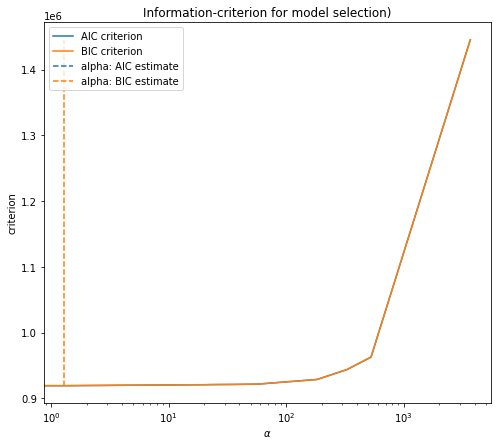

In [38]:
plot_aic_bic(alpha_aic=alpha_aic, alpha_bic=alpha_bic, results=results)

##### __Ridge Regression__

In [39]:
grid_res_lr_df[grid_res_lr_df.model_name=='Ridge'][show_cols]

,mean_train_score,mean_test_score,model_name,param_model__alpha
0,-1206.280597,-1205.045051,Ridge,1e-06
1,-1206.280597,-1205.045052,Ridge,1e-05
2,-1206.280597,-1205.045059,Ridge,0.0001
3,-1206.280597,-1205.045137,Ridge,0.001
4,-1206.280597,-1205.045909,Ridge,0.01
5,-1206.280598,-1205.053637,Ridge,0.1
6,-1206.280754,-1205.131037,Ridge,1
7,-1206.295931,-1205.916546,Ridge,10
8,-1207.536689,-1214.414691,Ridge,100
9,-1248.699264,-1292.818122,Ridge,1000


##### __Best Regularization with optimal penalty parameter__

In [40]:
grid_search_lr.best_params_

{'model': Ridge(alpha=1e-06, random_state=42), 'model__alpha': 1e-06}

#### Question 10

##### __Not scaled Feature results__

In [55]:
model_lr = LinearRegression()
cv_results_lr = apply_cv_to_model(model=model_lr, 
                                  X=X_diamonds_unscaled, y=y_diamonds, 
                                  model_name='Linear Regression (OLS)')

Linear Regression (OLS) Train Avg RMSE accross 10-fold cv:  1206.2805967946167
Linear Regression (OLS) Test Avg RMSE accross 10-fold cv:  1205.045050850984


In [42]:
grid_search_lr_unscl, grid_res_lr_df_unscl = linear_model_exp(X=X_diamonds_unscaled, y=y_diamonds)

00h00m12s


In [43]:
show_cols =['mean_train_score','mean_test_score','model_name','param_model__alpha']
grid_res_lr_df_unscl[grid_res_lr_df_unscl.model_name=='Lasso'][show_cols]

,mean_train_score,mean_test_score,model_name,param_model__alpha
12,-1206.280597,-1205.045053,Lasso,1e-06
13,-1206.280597,-1205.045073,Lasso,1e-05
14,-1206.280597,-1205.045263,Lasso,0.0001
15,-1206.280597,-1205.047165,Lasso,0.001
16,-1206.280609,-1205.066857,Lasso,0.01
17,-1206.281892,-1205.272222,Lasso,0.1
18,-1206.403372,-1207.533286,Lasso,1
19,-1215.137979,-1238.590955,Lasso,10
20,-1362.777782,-1459.776195,Lasso,100
21,-2049.825908,-1984.620077,Lasso,1000


In [44]:
grid_res_lr_df_unscl[grid_res_lr_df_unscl.model_name=='Ridge'][show_cols]

,mean_train_score,mean_test_score,model_name,param_model__alpha
0,-1206.280597,-1205.045051,Ridge,1e-06
1,-1206.280597,-1205.045055,Ridge,1e-05
2,-1206.280597,-1205.045088,Ridge,0.0001
3,-1206.280597,-1205.045421,Ridge,0.001
4,-1206.280597,-1205.048757,Ridge,0.01
5,-1206.280619,-1205.082125,Ridge,0.1
6,-1206.282816,-1205.417296,Ridge,1
7,-1206.492542,-1208.905905,Ridge,10
8,-1220.380991,-1249.715537,Ridge,100
9,-1388.872280,-1472.734228,Ridge,1000


#### Question 11

## Polynomial Regression

#### Question 12

In [45]:
def polynomial_feat_linear_model_exp(X,y):
    full_pipeline = Pipeline([
                            ('poly_features', "passthrough"),
                            ('model', "passthrough")
                             ])
    alphas = [10**(x) for x in range(-3,3)] # TODO CHANGE THESE RANGES LATER
    degrees = list(range(2,5))
    params = {
        "poly_features": [PolynomialFeatures()],
        "model": [Ridge(random_state=rand_seed),
                  Lasso(random_state=rand_seed)
               ],
        "poly_features__degree":degrees,
        "model__alpha": alphas
        
    }

    t0 = time.time()
    grid_search = GridSearchCV(full_pipeline, params, cv=10, 
                               scoring='neg_root_mean_squared_error', 
                               return_train_score=True)
    cv_results = grid_search.fit(X, y)
    t1 = time.time()
    elapsed = t1-t0
    print(time.strftime("%Hh%Mm%Ss", time.gmtime(elapsed)))
    grid_results_df = pd.DataFrame(grid_search.cv_results_)
    grid_results_df['model_name']= grid_results_df.param_model.apply(lambda x: 'Ridge' if type(x)==Ridge else 'Lasso')
    #grid_results_df.head()
    return grid_search, grid_results_df

In [74]:
#grid_search_poly, grid_res_poly_df = polynomial_feat_linear_model_exp(X=X_diamonds, y=y_diamonds)

In [ ]:
show_cols =['mean_train_score','mean_test_score','model_name','param_model__alpha']
grid_res_poly_df[grid_res_poly_df.model_name=='Lasso'][show_cols]

In [ ]:
grid_res_poly_df[grid_res_poly_df.model_name=='Ridge'][show_cols]

#### Question 13

In [ ]:
grid_search_poly.best_estimator_

#### Question 14

- x * y * z
- table * depth
- carat / volume; volume = x*y*z

__Create new features: Option 1- create from raw data and then scale__

In [ ]:
# create new features: Option 1- create from raw data and then scale
diamonds_new_feat_df = diamonds_df.copy()
diamonds_new_feat_df['x*y*z'] = diamonds_new_feat_df['x']*diamonds_new_feat_df['y']*diamonds_new_feat_df['z']
diamonds_new_feat_df['table*depth'] = diamonds_new_feat_df['table']*diamonds_new_feat_df['depth']
diamonds_new_num_cols = ['carat', 'x','y','z','table','depth', 'x*y*z','table*depth' ]
diamonds_new_feat_df = feature_transformer_diamonds(data=diamonds_new_feat_df, 
                                                numeric_feats=diamonds_new_num_cols, 
                                                categ_feats=diamonds_cat_cols,
                                                diamonds_categs_order=diamonds_categs_order,
                                                scale=True)
display(diamonds_new_feat_df.head())
diamonds_new_feat_df.describe()

In [ ]:
# OLS
features_q14= [
    ['carat', 'x*y*z', 'table*depth', 'cut', 'color', 'clarity'],
    ['carat', 'x','y','z', 'table*depth', 'cut', 'color', 'clarity'],
    ['carat', 'x*y*z', 'table','depth', 'cut', 'color', 'clarity']
]

for feat in features_q14:
    print('\n\nResults for features: ',features_q14_2)
    X_diamonds_new_feats= diamonds_new_feat_df[feat]

    model_lr_q14 = LinearRegression()
    cv_results_lr_q14 = apply_cv_to_model(model=model_lr_q14, 
                                      X=X_diamonds_new_feats, y=y_diamonds, 
                                      model_name='Linear Regression (OLS) with new features')

__Create new features: Option 2- create from scaled data__

In [ ]:
# create new features: Option 2- create from scaled data 
fs= [ 'x','y','z','table','depth']
diamonds_new_feat_df2 = diamonds_df.copy()
diamonds_new_feat_df2[fs] = diamonds_prep_df[fs]
diamonds_new_feat_df2['x*y*z'] = diamonds_new_feat_df2['x']*diamonds_new_feat_df2['y']*diamonds_new_feat_df2['z']
diamonds_new_feat_df2['table*depth'] = diamonds_new_feat_df2['table']*diamonds_new_feat_df2['depth']
diamonds_new_num_cols2 = ['carat', 'x*y*z','table*depth' ]
diamonds_new_feat_df2 = feature_transformer_diamonds(data=diamonds_new_feat_df2, 
                                                numeric_feats=diamonds_new_num_cols2, 
                                                categ_feats=diamonds_cat_cols,
                                                diamonds_categs_order=diamonds_categs_order,
                                                scale=True)
display(diamonds_new_feat_df2.head())
diamonds_new_feat_df2.describe()

In [ ]:
# OLS
features_q14= [
    ['carat', 'x*y*z', 'table*depth', 'cut', 'color', 'clarity'],
    ['carat', 'x','y','z', 'table*depth', 'cut', 'color', 'clarity'],
    ['carat', 'x*y*z', 'table','depth', 'cut', 'color', 'clarity']
]

for feat in features_q14:
    print('\n\nResults for features: ',features_q14_2)
    X_diamonds_new_feats= diamonds_new_feat_df2[feat]

    model_lr_q14 = LinearRegression()
    cv_results_lr_q14 = apply_cv_to_model(model=model_lr_q14, 
                                      X=X_diamonds_new_feats, y=y_diamonds, 
                                      model_name='Linear Regression (OLS) with new features')